In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import plotly.express as px

In [3]:
df_listing = pd.read_csv('./Data/August/listings.csv', compression='gzip', encoding='utf-8')
df_listing_zip = pd.read_csv('./Data/August/listings.csv.gz')
df_calender_zip = pd.read_csv('./Data/August/calendar.csv.gz', low_memory=False)
df_reviews_zip = pd.read_csv('./Data/August/reviews.csv.gz', low_memory=False)
df_reviews = pd.read_csv('./Data/August/reviews.csv', low_memory=False)
df_neighbourhoods = pd.read_csv('./Data/August/reviews.csv')

In [4]:
df_listing_zip.columns

Index(['id', 'listing_url', 'scrape_id', 'last_scraped', 'source', 'name',
       'description', 'neighborhood_overview', 'picture_url', 'host_id',
       'host_url', 'host_name', 'host_since', 'host_location', 'host_about',
       'host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_thumbnail_url', 'host_picture_url',
       'host_neighbourhood', 'host_listings_count',
       'host_total_listings_count', 'host_verifications',
       'host_has_profile_pic', 'host_identity_verified', 'neighbourhood',
       'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'latitude',
       'longitude', 'property_type', 'room_type', 'accommodates', 'bathrooms',
       'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price',
       'minimum_nights', 'maximum_nights', 'minimum_minimum_nights',
       'maximum_minimum_nights', 'minimum_maximum_nights',
       'maximum_maximum_nights', 'minimum_nights_avg_ntm',
       'maximum_nights_avg_ntm', 'ca

In [5]:
pd.options.display.max_columns = 75

In [6]:
df_listing_zip.head(3)

,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,1419,https://www.airbnb.com/rooms/1419,20240807164212,2024-08-08,previous scrape,Beautiful home in amazing area!,"This large, family home is located in one of T...",The apartment is located in the Ossington stri...,https://a0.muscache.com/pictures/76206750/d643...,1565,https://www.airbnb.com/users/show/1565,Alexandra,2008-08-08,"Vancouver, Canada","I live in Vancouver, Canada with my husband an...",NaN,NaN,NaN,f,https://a0.muscache.com/im/pictures/user/7aeea...,https://a0.muscache.com/im/pictures/user/7aeea...,Commercial Drive,1.0,1.0,"['email', 'phone']",t,t,Neighborhood highlights,Little Portugal,NaN,43.64590,-79.42423,Entire home,Entire home/apt,10,NaN,3 baths,5.0,NaN,"[""Shampoo"", ""Kitchen"", ""Heating"", ""First aid k...",NaN,28,730,28,28,730,730,28.0,730.0,NaN,t,0,0,0,0,2024-08-08,6,0,0,2015-07-19,2017-08-07,5.00,5.00,5.00,5.00,5.00,5.00,5.00,NaN,f,1,1,0,0,0.05
1,573892,https://www.airbnb.com/rooms/573892,20240807164212,2024-08-08,city scrape,DOWNTOWN TORONTO LUXURY FURNISHED CORPORATE SUITE,Amazing location in the heart of downtown Toro...,"Great location close to the Lake, sporting eve...",https://a0.muscache.com/pictures/60047477/c996...,2175675,https://www.airbnb.com/users/show/2175675,Frank,2012-04-19,"Toronto, Canada","FULLY FURNISHED 1 BEDROOM, 1 BEDROOM PLUS DEN ...",within an hour,100%,94%,f,https://a0.muscache.com/im/users/2175675/profi...,https://a0.muscache.com/im/users/2175675/profi...,Entertainment District,6.0,6.0,"['email', 'phone']",t,t,Neighborhood highlights,Waterfront Communities-The Island,NaN,43.64278,-79.37985,Entire condo,Entire home/apt,2,1.0,1 bath,1.0,1.0,"[""Shampoo"", ""Long term stays allowed"", ""Elevat...",$119.00,28,1125,28,28,1125,1125,28.0,1125.0,NaN,t,3,7,37,312,2024-08-08,86,3,1,2012-09-01,2024-07-22,4.83,4.79,4.83,4.87,4.88,4.94,4.75,NaN,f,4,4,0,0,0.59
2,593324,https://www.airbnb.com/rooms/593324,20240807164212,2024-08-08,previous scrape,Charming Victorian in Leslieville,Great space in a great neighbourhood!,My neighbourhood known as Riverside (or to Rea...,https://a0.muscache.com/pictures/65059208/0f30...,2929774,https://www.airbnb.com/users/show/2929774,Susan,2012-07-13,"Toronto, Canada",I am a retired teacher who travels a great dea...,NaN,NaN,NaN,f,https://a0.muscache.com/im/users/2929774/profi...,https://a0.muscache.com/im/users/2929774/profi...,Riverdale,1.0,2.0,"['email', 'phone']",t,t,Neighborhood highlights,South Riverdale,NaN,43.66114,-79.34742,Entire home,Entire home/apt,3,NaN,1.5 baths,2.0,NaN,"[""Shampoo"", ""Kitchen"", ""Heating"", ""First aid k...",NaN,28,30,28,28,30,30,28.0,30.0,NaN,t,0,0,0,0,2024-08-08,7,0,0,2012-10-28,2015-10-06,4.86,4.83,4.83,5.00,4.83,5.00,4.83

In [7]:
# Host original Location
df_listing_zip['host_location'].value_counts()

host_location
Toronto, Canada                  14452
Canada                             191
Montreal, Canada                   131
Mississauga, Canada                106
Vaughan, Canada                     82
                                 ...  
Durban, South Africa                 1
Mont-Tremblant, Canada               1
Kelowna, Canada                      1
Esplugues de Llobregat, Spain        1
Plainsboro Township, NJ              1
Name: count, Length: 263, dtype: int64

In [8]:
len(df_listing_zip['price'])

21649

In [9]:
df_listing_zip['price'].isnull().values.sum()

5295

In [10]:
# Percentage of Null value in price
number_of_null = (df_listing_zip['price'].isnull().values.sum())
total_data = (len(df_listing_zip['price']))
percentage_null = (number_of_null/total_data)*100
print(f'Percenatge of null value in price: {percentage_null}')


Percenatge of null value in price: 24.458404545244584


In [11]:
df_listing_zip['price'].isna().values.any()

True

In [12]:
df_listing_zip['price'].loc[df_listing_zip['price'].isna()]

0        NaN
2        NaN
3        NaN
6        NaN
7        NaN
        ... 
20937    NaN
20939    NaN
20949    NaN
20997    NaN
21050    NaN
Name: price, Length: 5295, dtype: object

In [13]:
df_listing_zip['price'] = df_listing_zip['price'].astype('str').str.replace('$','')
df_listing_zip['price'] = df_listing_zip['price'].astype('str').str.replace(',','', regex=False)
df_listing_zip['price']= pd.to_numeric(df_listing_zip['price'], errors='coerce')

In [14]:
df_listing_zip['price'].isna().values.any()

True

In [15]:
df_listing_zip['price'].isna().sum()

5295

In [16]:
# Filling NaN with mean.
df_listing_zip['price'] = df_listing_zip['price'].fillna(df_listing_zip['price'].mean())

In [17]:
print(f"Mean:{df_listing_zip['price'].mean()}")
print(f"Max: {df_listing_zip['price'].max()}")
print(f"Min: {df_listing_zip['price'].min()}")

Mean:201.29466797113855
Max: 12400.0
Min: 11.0


In [18]:
df_listing_zip['Price_Range'] = pd.cut(df_listing_zip['price'], bins=[0,100,150,200,250,300,350,400,450,500,600,700,800,900,1000, df_listing_zip['price'].max()])
price_category = df_listing_zip['Price_Range'].value_counts().sort_index()

In [19]:
price_category

Price_Range
(0.0, 100.0]         5730
(100.0, 150.0]       3181
(150.0, 200.0]       2231
(200.0, 250.0]       6733
(250.0, 300.0]       1195
(300.0, 350.0]        705
(350.0, 400.0]        490
(400.0, 450.0]        313
(450.0, 500.0]        275
(500.0, 600.0]        263
(600.0, 700.0]        161
(700.0, 800.0]        105
(800.0, 900.0]         70
(900.0, 1000.0]        72
(1000.0, 12400.0]     125
Name: count, dtype: int64

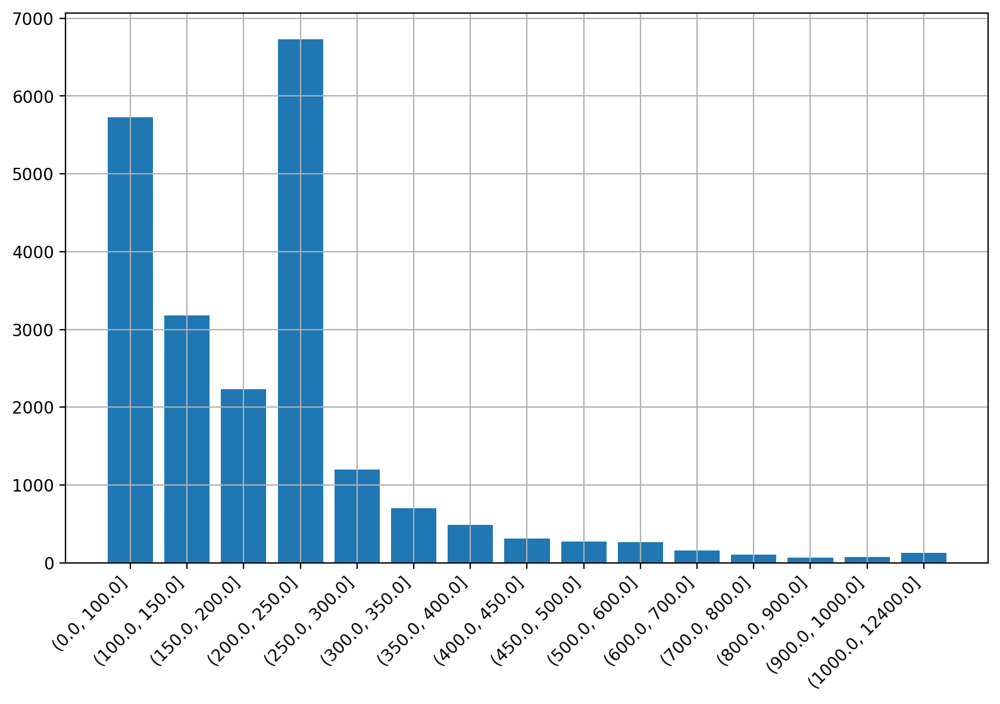

In [20]:
plt.figure(figsize=(10,6), dpi=200)
plt.bar(price_category.index.astype('str'), price_category.values )
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.grid()
plt.show()

In [21]:
df_reviews_zip.head()

,listing_id,id,date,reviewer_id,reviewer_name,comments
0,573892,2163249,2012-09-01,3226641,Meera,My boyfriend & I had a wonderful 4 day/3 night...
1,1419,38924112,2015-07-19,11308465,Marcela,Having the opportunity of arriving to Alexandr...
2,1419,44791978,2015-08-29,9580285,Marco,We have no enough words to describe how beauty...
3,1419,45957133,2015-09-07,38394721,Andrea,The listing was exceptional and an even better...
4,1419,67295154,2016-03-28,3515044,Shaun,Alexandra's home was amazing and in such a nea...


In [22]:
df_calender_zip.head()

,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights
0,573892,2024-08-08,f,$149.00,NaN,28.0,1125.0
1,573892,2024-08-09,f,$149.00,NaN,28.0,1125.0
2,573892,2024-08-10,f,$149.00,NaN,28.0,1125.0
3,573892,2024-08-11,f,$149.00,NaN,28.0,1125.0
4,573892,2024-08-12,f,$149.00,NaN,28.0,1125.0


In [23]:
df_listing_zip['amenities']

0        ["Shampoo", "Kitchen", "Heating", "First aid k...
1        ["Shampoo", "Long term stays allowed", "Elevat...
2        ["Shampoo", "Kitchen", "Heating", "First aid k...
3        ["Gym", "Shampoo", "TV with standard cable", "...
4        ["Shampoo", "Long term stays allowed", "Elevat...
                               ...                        
21644    ["Exercise equipment", "Kitchen", "TV", "Smoke...
21645    ["Hangers", "Exercise equipment", "Pool table"...
21646    ["Shampoo", "Long term stays allowed", "Clothi...
21647    ["Shampoo", "TV", "Essentials", "Wifi", "Self ...
21648    ["Gym", "Shampoo", "Housekeeping - available a...
Name: amenities, Length: 21649, dtype: object

In [24]:
# Count the number of amenities
import ast
def count_amenities(seriees):
    list = ast.literal_eval(seriees)
    return len(list)

df_listing_zip['Amenities_Count'] = df_listing_zip['amenities'].apply(count_amenities)



<Axes: xlabel='Amenities_Count', ylabel='price'>

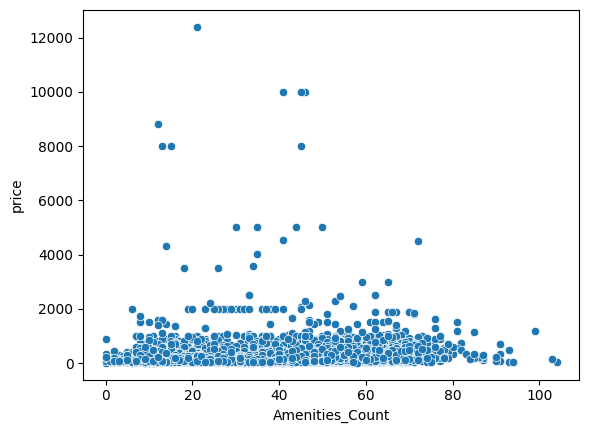

In [25]:
sns.scatterplot(data=df_listing_zip, x = 'Amenities_Count', y = 'price')

In [26]:
fig = px.scatter(df_listing_zip, y = 'Amenities_Count',
           x = 'price',
           color= 'Price_Range',
           color_continuous_scale='Viridis')
fig.show()

c:\Users\subas\AppData\Local\Programs\Python\Python311\Lib\site-packages\plotly\express\_core.py:2044: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = df.groupby(required_grouper, sort=False)  # skip one_group groupers
c:\Users\subas\AppData\Local\Programs\Python\Python311\Lib\site-packages\plotly\express\_core.py:2065: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  sf: grouped.get_group(s if len(s) > 1 else s[0])


In [27]:
fig = px.scatter(df_listing_zip.loc[df_listing_zip['price'] < 1000], x = 'minimum_nights',
           y = 'price',
           color= 'host_neighbourhood',
           color_continuous_scale='Viridis')
fig.show()

c:\Users\subas\AppData\Local\Programs\Python\Python311\Lib\site-packages\plotly\express\_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



In [28]:
fig = px.scatter(df_listing_zip.loc[df_listing_zip['price'] < 1000], x = 'Amenities_Count',
           y = 'price',
           color= 'property_type',
           color_continuous_scale='Viridis')
fig.show()

c:\Users\subas\AppData\Local\Programs\Python\Python311\Lib\site-packages\plotly\express\_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



In [29]:
# Calculating average number for review for each price range
fig = px.scatter(df_listing_zip.loc[df_listing_zip['price'] < 1000], x = 'number_of_reviews',
           y = 'price',
           color= 'Amenities_Count',
           color_continuous_scale='Viridis')
fig.show()

In [30]:
df_reviews_zip.head()

,listing_id,id,date,reviewer_id,reviewer_name,comments
0,573892,2163249,2012-09-01,3226641,Meera,My boyfriend & I had a wonderful 4 day/3 night...
1,1419,38924112,2015-07-19,11308465,Marcela,Having the opportunity of arriving to Alexandr...
2,1419,44791978,2015-08-29,9580285,Marco,We have no enough words to describe how beauty...
3,1419,45957133,2015-09-07,38394721,Andrea,The listing was exceptional and an even better...
4,1419,67295154,2016-03-28,3515044,Shaun,Alexandra's home was amazing and in such a nea...


In [31]:
df_calender_zip[df_calender_zip['listing_id'] == 1419].head(3)

,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights
730,1419,2024-08-08,f,$469.00,NaN,28.0,730.0
731,1419,2024-08-09,f,$469.00,NaN,28.0,730.0
732,1419,2024-08-10,f,$469.00,NaN,28.0,730.0


In [32]:
df_listing_zip[df_listing_zip['id'] == 1419]

,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bathrooms_text,...,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,Price_Range,Amenities_Count
0,1419,https://www.airbnb.com/rooms/1419,20240807164212,2024-08-08,previous scrape,Beautiful home in amazing area!,"This large, family home is located in one of T...",The apartment is located in the Ossington stri...,https://a0.muscache.com/pictures/76206750/d643...,1565,https://www.airbnb.com/users/show/1565,Alexandra,2008-08-08,"Vancouver, Canada","I live in Vancouver, Canada with my husband an...",NaN,NaN,NaN,f,https://a0.muscache.com/im/pictures/user/7aeea...,https://a0.muscache.com/im/pictures/user/7aeea...,Commercial Drive,1.0,1.0,"['email', 'phone']",t,t,Neighborhood highlights,Little Portugal,NaN,43.6459,-79.42423,Entire home,Entire home/apt,10,NaN,3 baths,...,201.294668,28,730,28,28,730,730,28.0,730.0,NaN,t,0,0,0,0,2024-08-08,6,0,0,2015-07-19,2017-08-07,5.0,5.0,5.0,5.0,5.0,5.0,5.0,NaN,f,1,1,0,0,0.05,"(200.0, 250.0]",13


# Importing merge data (Data was merged based on above data insight)

In [33]:
import glob
import os
def Merging_files(file_name):
    path_pattern = f'Data/*/{file_name}' 
    dataframes = []

    # Using glob to get a list of all matching file paths
    all_files = glob.glob(path_pattern)

    for f in all_files:
        month = os.path.basename(os.path.dirname(f))
        
        df = pd.read_csv(f)
        
        df['Month'] = month
        
        dataframes.append(df)
        
    combined_df = pd.concat(dataframes, ignore_index=True)
    return combined_df

listing_merge = Merging_files('listings.csv.gz')

In [34]:
listing_merge.shape

(248523, 76)

In [35]:
listing_merge['price'] = listing_merge['price'].astype('str').str.replace('$','')
listing_merge['price'] = listing_merge['price'].astype('str').str.replace(',','', regex=False)
listing_merge['price']= pd.to_numeric(listing_merge['price'], errors='coerce')

In [36]:
px.histogram(listing_merge[listing_merge['price']<1000], x='price')

In [37]:
listing_merge['Price_Range'] = pd.cut(listing_merge['price'], bins=[0,100,150,200,250,300,350,400,450,500,600,700,800,900,1000, df_listing_zip['price'].max()])
price_category = listing_merge['Price_Range'].value_counts().sort_index()
price_category

Price_Range
(0.0, 100.0]         78302
(100.0, 150.0]       41767
(150.0, 200.0]       27711
(200.0, 250.0]       16825
(250.0, 300.0]       12051
(300.0, 350.0]        6636
(350.0, 400.0]        4684
(400.0, 450.0]        2835
(450.0, 500.0]        2520
(500.0, 600.0]        2713
(600.0, 700.0]        1323
(700.0, 800.0]        1007
(800.0, 900.0]         665
(900.0, 1000.0]        690
(1000.0, 12400.0]     1632
Name: count, dtype: int64

In [38]:
percentage = (price_category/len(listing_merge))*100
percentage

Price_Range
(0.0, 100.0]         31.506943
(100.0, 150.0]       16.806090
(150.0, 200.0]       11.150276
(200.0, 250.0]        6.769997
(250.0, 300.0]        4.849048
(300.0, 350.0]        2.670175
(350.0, 400.0]        1.884735
(400.0, 450.0]        1.140739
(450.0, 500.0]        1.013991
(500.0, 600.0]        1.091649
(600.0, 700.0]        0.532345
(700.0, 800.0]        0.405194
(800.0, 900.0]        0.267581
(900.0, 1000.0]       0.277640
(1000.0, 12400.0]     0.656680
Name: count, dtype: float64

In [121]:
lsiting_more_1000 = listing_merge[listing_merge['price'] > 1000]

In [40]:
px.histogram(lsiting_more_1000, x = 'price')

# Outliers Analysis

In [100]:
Q1 = listing_merge['price'].quantile(0.25)
Q3 = listing_merge['price'].quantile(0.75)
IQR = Q3 - Q1

# Define the lower and upper bounds
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

print(lower_bound)
print(upper_bound)

# Find outliers in the 'price' column
outliers = listing_merge[(listing_merge['price'] < lower_bound) | (listing_merge['price'] > upper_bound)]

print(f"Number of outliers in the 'price' column: {outliers.shape[0]}")
outliers[['price', 'neighbourhood_cleansed', 'room_type', 'property_type']].head()

-120.5
411.5
Number of outliers in the 'price' column: 12916


,price,neighbourhood_cleansed,room_type,property_type
33,500.0,Rosedale-Moore Park,Entire home/apt,Entire home
143,450.0,Palmerston-Little Italy,Entire home/apt,Entire home
216,449.0,Trinity-Bellwoods,Entire home/apt,Entire home
246,899.0,South Riverdale,Entire home/apt,Entire condo
272,598.0,Niagara,Entire home/apt,Entire loft


# Analysis for those which are consider outliers

In [99]:
Q1 = lsiting_more_1000['price'].quantile(0.25)
Q3 = lsiting_more_1000['price'].quantile(0.75)
IQR = Q3 - Q1

# Define the lower and upper bounds
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

print(lower_bound)
print(upper_bound)

# Find outliers in the 'price' column
outliers = lsiting_more_1000[(lsiting_more_1000['price'] < lower_bound) | (lsiting_more_1000['price'] > upper_bound)]

print(f"Number of outliers in the 'price' column: {outliers.shape[0]}")
outliers[['price', 'neighbourhood_cleansed', 'room_type', 'property_type']].head()

175.0
3175.0
Number of outliers in the 'price' column: 278


,price,neighbourhood_cleansed,room_type,property_type
2151,5000.0,Annex,Entire home/apt,Entire villa
2539,3500.0,Waterfront Communities-The Island,Entire home/apt,Entire condo
3376,9999.0,Clairlea-Birchmount,Private room,Private room in home
3559,3500.0,Waterfront Communities-The Island,Entire home/apt,Entire rental unit
4465,9999.0,Little Portugal,Entire home/apt,Entire home


In [96]:
import plotly.express as px

# Create a boxplot to visualize the distribution of the 'price' column and outliers
fig = px.box(listing_merge, y='price', title='Boxplot of Price with Outliers')
fig.update_layout(
    yaxis_title='Price',
    xaxis_title='Listings'
)
fig.show()

# Neighbourhood with highest number of expensive listing

In [69]:
import plotly.graph_objects as go

In [95]:
import plotly.graph_objects as go

expensive_neighbourhood = lsiting_more_1000.groupby('neighbourhood_cleansed').agg(num_of_listing = ('price', 'count'),
                                                                                  mean_price = ('price', 'mean')). sort_values('num_of_listing', ascending=False)

average_price = expensive_neighbourhood['mean_price']
count_price = expensive_neighbourhood['num_of_listing']

fig = go.Figure()


fig.add_trace(
    go.Bar(
        x=expensive_neighbourhood.index,
        y=count_price,
        name='Number of Listings',
        marker_color='skyblue',
        yaxis='y1' 
    )
)

fig.add_trace(
    go.Scatter(
        x=expensive_neighbourhood.index,
        y=average_price,
        mode='lines',
        name='Average Price',
        line=dict(color='red', dash='dash'),
        yaxis='y2'
    )
)


fig.update_layout(
    xaxis_title='Neighbourhood',
    yaxis=dict(
        title='Number of Listings',
        showgrid=False,
        side='left'
    ),
    yaxis2=dict(
        title='Average Price',
        overlaying='y',
        side='right',
        showgrid=False
    ),
    title='Expensive listing neighbourhood analysis',
    legend=dict(x=0.75, y=1)
)

fig.show()


In [93]:
import plotly.graph_objects as go

expensive_neighbourhood = listing_merge.groupby('neighbourhood_cleansed').agg(num_of_listing = ('price', 'count'),
                                                                                  mean_price = ('price', 'mean')). sort_values('num_of_listing', ascending=False).head(20)

average_price = expensive_neighbourhood['mean_price']
count_price = expensive_neighbourhood['num_of_listing']

fig = go.Figure()


fig.add_trace(
    go.Bar(
        x=expensive_neighbourhood.index,
        y=count_price,
        name='Number of Listings',
        marker_color='skyblue',
        yaxis='y1' 
    )
)

fig.add_trace(
    go.Scatter(
        x=expensive_neighbourhood.index,
        y=average_price,
        mode='lines',
        name='Average Price',
        line=dict(color='red', dash='dash'),
        yaxis='y2'
    )
)


fig.update_layout(
    xaxis_title='Neighbourhood',
    yaxis=dict(
        title='Number of Listings',
        showgrid=True,
        side='left'
    ),
    yaxis2=dict(
        title='Average Price',
        overlaying='y',
        side='right',
        showgrid=True
    ),
    title='Overall listing',
    legend=dict(x=0.75, y=1)
)

fig.show()

In [48]:
lsiting_more_1000[['price','Price_Range']].sort_values('price', ascending=False).head(30)

,price,Price_Range
210106,13706.0,NaN
199468,13664.0,NaN
205001,13000.0,NaN
212688,13000.0,NaN
211121,13000.0,NaN
207146,13000.0,NaN
130888,12400.0,"(1000.0, 12400.0]"
68521,12400.0,"(1000.0, 12400.0]"
6013,12400.0,"(1000.0, 12400.0]"
26633,12400.0,"(1000.0, 12400.0]"


In [54]:
room_type = lsiting_more_1000.groupby(['property_type', 'room_type']).agg({'price': pd.Series.mean})

In [56]:
room_type

,,price
property_type,room_type,
Entire bungalow,Entire home/apt,5333.333333
Entire condo,Entire home/apt,2692.784375
Entire guest suite,Entire home/apt,1023.000000
Entire guesthouse,Entire home/apt,2403.000000
Entire home,Entire home/apt,2230.535055
Entire home/apt,Entire home/apt,2482.352941
Entire loft,Entire home/apt,6848.000000
Entire rental unit,Entire home/apt,2247.680891
Entire townhouse,Entire home/apt,1507.783784


In [112]:
import ast

listing_below_1000 = listing_merge[listing_merge['price'] < 1000]

amenities = listing_merge['amenities'].apply(ast.literal_eval)

amenities_expanded = amenities.explode()

amenities_count_below_1000 = amenities_expanded.value_counts()

amenities_count_below_1000

# print(lsiting_more_1000['amenities'].head(10))

amenities
Smoke alarm                                                                199848
Kitchen                                                                    191698
Wifi                                                                       187276
Carbon monoxide alarm                                                      177607
Essentials                                                                 172402
                                                                            ...  
50" HDTV with Amazon Prime Video, Disney+, Netflix, Roku, DVD player            1
55" HDTV with Amazon Prime Video, Disney+, Netflix, premium cable, Roku         1
Assorted  shampoo                                                               1
47" HDTV with premium cable, Roku                                               1
Air Fryer  oven                                                                 1
Name: count, Length: 7801, dtype: int64

In [132]:
# Ensure 'amenities' are in proper format
# lsiting_more_1000['amenities'] = lsiting_more_1000['amenities'].apply(ast.literal_eval)

# Explode the amenities into separate rows
amenities_expanded = lsiting_more_1000['amenities'].explode()

# Count occurrences of each amenity
amenities_count = amenities_expanded.value_counts()

# Calculate percentage of listings with each amenity
total_listings = lsiting_more_1000.shape[0]  # Total number of listings
amenities_percentage = (amenities_count / total_listings) * 100

# Create a DataFrame for better visualization
amenities_df_above_1000 = pd.DataFrame({
    'Amenity': amenities_count.index,
    'Count': amenities_count.values,
    'Percentage': amenities_percentage.values
})

# Display the resulting DataFrame
print(amenities_df_above_1000.head(50))

                       Amenity  Count  Percentage
0                  Smoke alarm   1253   76.495726
1                      Kitchen   1251   76.373626
2                         Wifi   1244   75.946276
3        Carbon monoxide alarm   1188   72.527473
4                   Essentials   1049   64.041514
5                    Hot water   1017   62.087912
6            Fire extinguisher   1012   61.782662
7               Cooking basics    953   58.180708
8                      Hangers    940   57.387057
9        Dishes and silverware    931   56.837607
10                  Hair dryer    913   55.738706
11                   Microwave    903   55.128205
12                  Bed linens    897   54.761905
13                        Iron    885   54.029304
14                     Heating    883   53.907204
15                      Washer    834   50.915751
16                Refrigerator    817   49.877900
17     Long term stays allowed    810   49.450549
18            Air conditioning    807   49.267399


In [133]:
# # Ensure 'amenities' are in proper format
# listing_below_1000['amenities'] = listing_below_1000['amenities'].apply(ast.literal_eval)

# Explode the amenities into separate rows
amenities_expanded = listing_below_1000['amenities'].explode()

# Count occurrences of each amenity
amenities_count = amenities_expanded.value_counts()

# Calculate percentage of listings with each amenity
total_listings = listing_below_1000.shape[0]  # Total number of listings
amenities_percentage = (amenities_count / total_listings) * 100

# Create a DataFrame for better visualization
amenities_df_below_1000 = pd.DataFrame({
    'Amenity': amenities_count.index,
    'Count': amenities_count.values,
    'Percentage': amenities_percentage.values
})

# Display the resulting DataFrame
print(amenities_df_below_1000.head(50))

                       Amenity   Count  Percentage
0                  Smoke alarm  158872   79.660643
1                      Kitchen  151078   75.752622
2                         Wifi  146193   73.303215
3        Carbon monoxide alarm  143777   72.091799
4                   Essentials  134434   67.407088
5                    Hot water  130868   65.619046
6                      Hangers  130126   65.246997
7        Dishes and silverware  126066   63.211256
8                   Hair dryer  122895   61.621272
9               Cooking basics  116499   58.414228
10                   Microwave  114624   57.474077
11                Refrigerator  114417   57.370284
12                        Iron  110045   55.178102
13                  Bed linens  109769   55.039712
14                     Shampoo  105964   53.131832
15         Dedicated workspace  104837   52.566738
16            Air conditioning  100952   50.618745
17           Fire extinguisher   99470   49.875649
18            Hot water kettle 

In [138]:
comparison_df = pd.merge(
    amenities_df_above_1000,
    amenities_df_below_1000,
    on='Amenity',
    how='outer',
    suffixes=('_Above_1500', '_Below_1500')
)

# Filling NaN values with 0 for Count and Percentage columns
comparison_df.fillna(0, inplace=True)

# Calculating differences
comparison_df['Percentage_Difference'] = comparison_df['Percentage_Above_1500'] - comparison_df['Percentage_Below_1500']

# Optional: Add a column to classify whether an amenity is more prevalent in one group
# comparison_df['More_Prevalent'] = comparison_df.apply(
#     lambda row: 'Above 1500' if row['Count_Difference'] > 0 else ('Below 1500' if row['Count_Difference'] < 0 else 'Equal'),
#     axis=1
# )

# Display the comparison DataFrame
comparison_df = comparison_df[comparison_df['Percentage_Difference'] > 0].sort_values('Percentage_Difference', ascending=False)

comparison_df['Amenity'].head(10)

5423                            Heating
4684                  Fire extinguisher
3798                              Dryer
3696                         Dishwasher
6480          Paid parking off premises
6635                   Private entrance
3235                  Barbecue utensils
3545                       Coffee maker
7248                                 TV
6629    Private backyard – Fully fenced
Name: Amenity, dtype: object

In [141]:
top20 = comparison_df[0:20]
px.bar(top20, x=top20['Amenity'], y=top20['Percentage_Difference'])